In [1]:
import json
import numpy as np
import scipy as sp
import skimage.filters as skf
import sys
import warnings
import matplotlib.pyplot as plt
import math
import stemtool as st
%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams.update({'font.size': 25})
plt.rcParams.update({'font.weight': 'bold'})
plt.rcParams.update({'figure.autolayout': True})

In [2]:
folder_loc = '/home/qz7/Data/TMD 4D-STEM/Nion Swift Library 20190126 MoSe2 CVD B17/'
data_num = 'Data1'
st.tic()
Data_4D = np.load(folder_loc+data_num+'_4D.npy')
json_4D = folder_loc+data_num+'_4D.json'
DataADF = np.load(folder_loc+data_num+'_ADF.npy')
jsonADF = folder_loc+data_num+'_ADF.json'
with open(json_4D) as json__4D:
    info_4D = json.load(json__4D)
with open(jsonADF) as json_ADF:
    infoADF = json.load(json_ADF)
st.toc()

Elapsed time: 3.414989 seconds.



In [3]:
scan_calib_vals = infoADF['spatial_calibrations'][0]['scale']
scan_calib_unit = infoADF['spatial_calibrations'][0]['units']

In [4]:
DPC = st.dpc.atomic_dpc(Data_4D, DataADF, 1000*infoADF['spatial_calibrations'][0]['scale'], 60000, 32/1000)

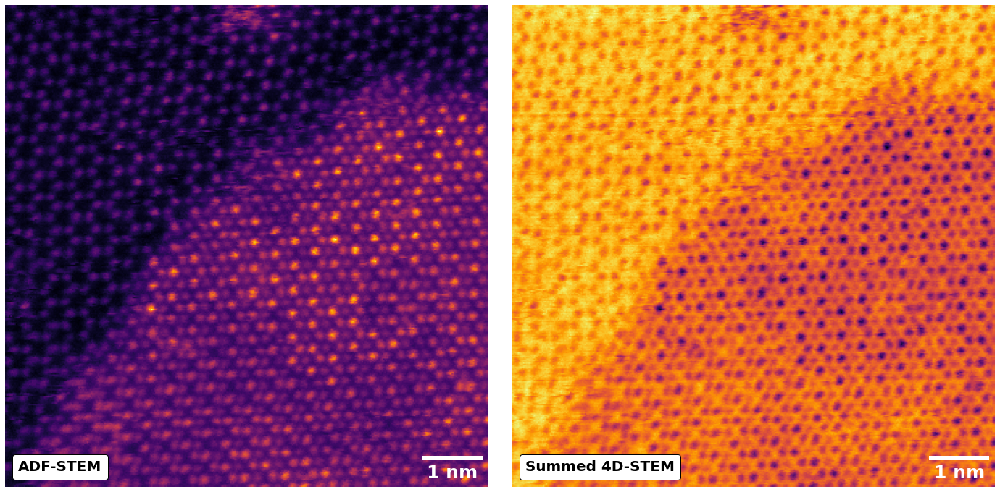

In [5]:
DPC.show_ADF_BF()

In [6]:
st.tic()
DPC.get_cbed()
st.toc()

Elapsed time: 0.901728 seconds.



Elapsed time: 10.385539 seconds.



/home/qz7/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


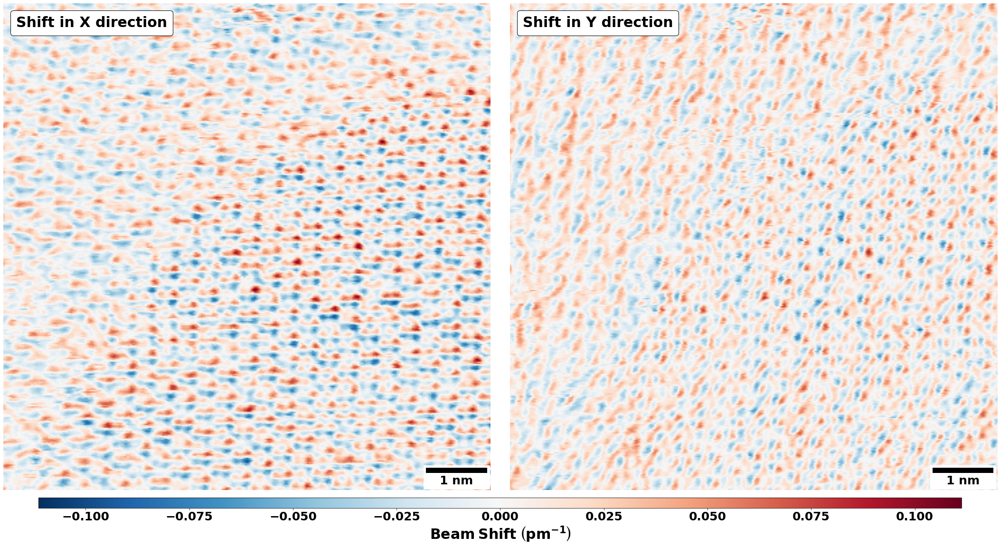

In [7]:
st.tic()
DPC.initial_dpc()
st.toc()

Elapsed time: 1.477225 seconds.



/home/qz7/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


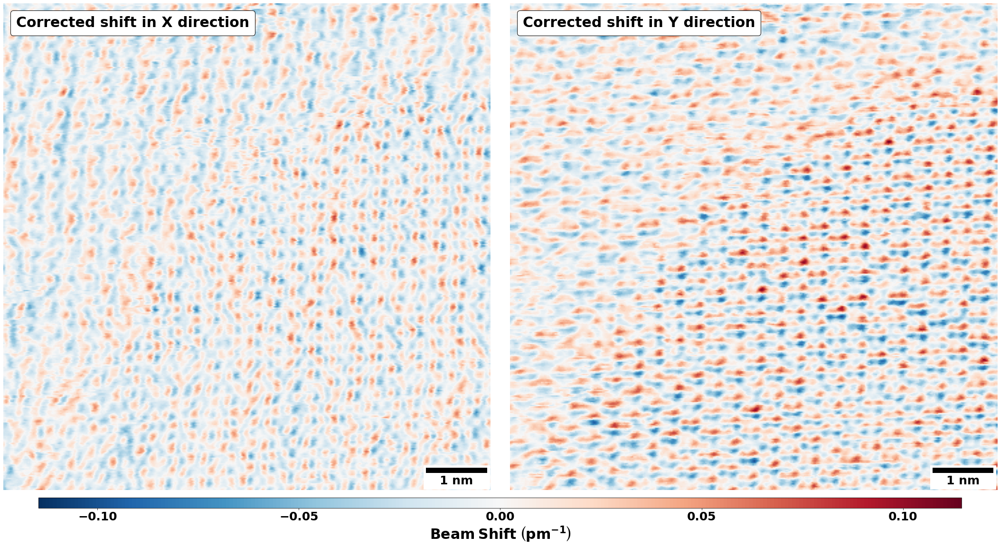

In [8]:
st.tic()
DPC.correct_dpc()
st.toc()

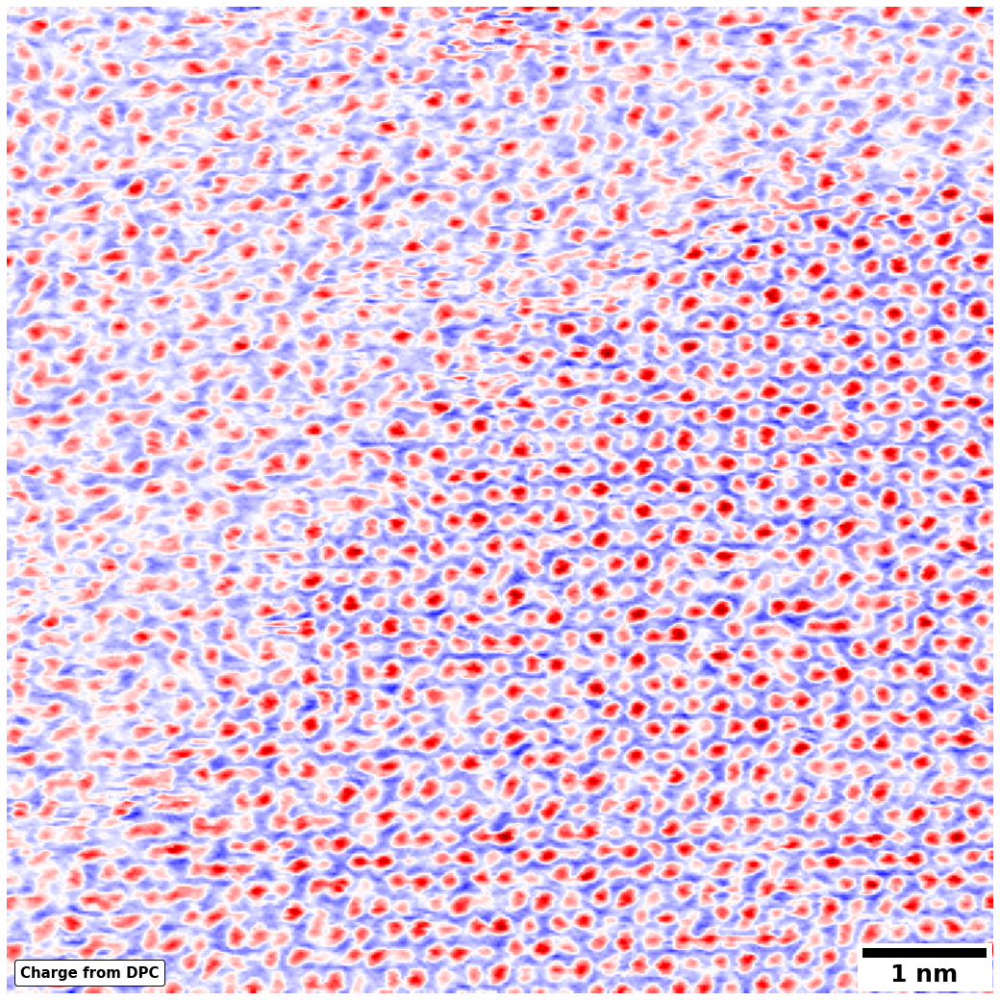

In [9]:
DPC.show_charge()

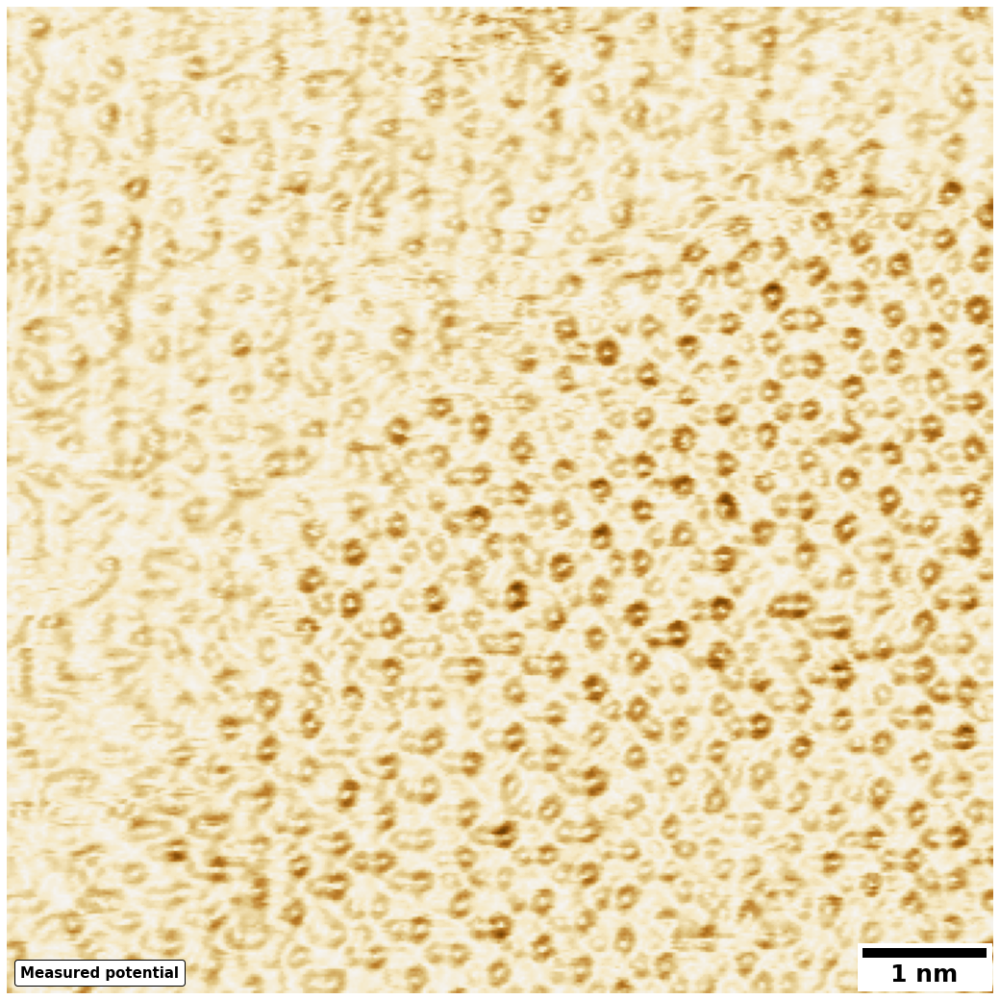

In [10]:
DPC.show_potential()

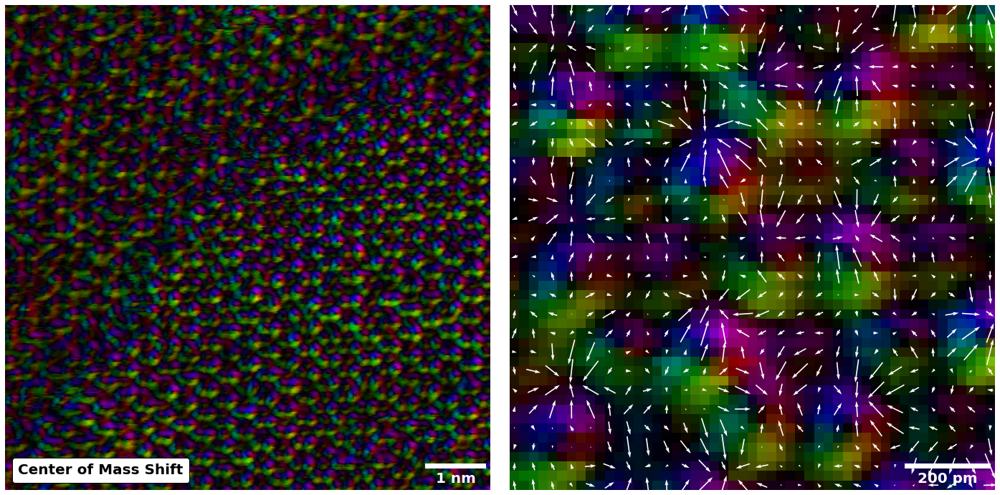

In [11]:
DPC.plot_color_dpc()

In [12]:
help(st.dpc.atomic_dpc)

Help on class atomic_dpc in module stemtool.dpc.atomic_dpc:

class atomic_dpc(builtins.object)
 |  atomic_dpc(Data_4D, Data_ADF, calib_pm, voltage, aperture)
 |  
 |  Atomic Resolution DPC estimation
 |  
 |  Parameters
 |  ----------
 |  Data_4D:  ndarray
 |            Four-dimensional dataset where the first two
 |            dimensions are real space scanning dimensions,
 |            while the last two dimenions are the Fourier 
 |            space electron diffraction patterns
 |  Data_ADF: ndarray
 |            Simultaneously collected two-dimensional ADF-STEM
 |            image
 |  calib_pm: float
 |            Real space pixel calibration in picometers
 |  voltage:  float
 |            Microscope accelerating voltage
 |  aperture: float
 |            The probe forming condenser aperture in milliradians
 |  
 |  Notes
 |  -----
 |  This class function takes in a 4D-STEM image, and a simultaneously
 |  collected atomic resolution ADF-STEM image. Based on the accelerating
 |  vol